# Note :- if you want to Run this Notebook first of all you have to accelerate your Gpu then after you run this notebook , without accelerating GPU if try to run it . it will throw error 

1. My first approach is to try this task using the pre-trained YOLOv8n-segmentation model To do this.because as you provide us image folder and json annotated file  To do this task
2. so I have to convert the given JSON format data into the YOLO format, which includes training, testing, and validation data, as well as a YAML file. Since YOLOv8n-segmentation  does not accept JSON format data, so  I am using Roboflow to make the data compatible with YOLOv8n-seg.pt."

# Load the data folder

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input/data-car-detection'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        

/kaggle/input/data-car-detection/README.dataset.txt
/kaggle/input/data-car-detection/README.roboflow.txt
/kaggle/input/data-car-detection/data.yaml
/kaggle/input/data-car-detection/valid/labels/-0a5b13261c540bd8b784b18eccefd2ef_jpg.rf.51abdaa9e9b02060bf851e6a94af4a58.txt
/kaggle/input/data-car-detection/valid/labels/-0a6cb92ae32f0ead50bd7e873685549b_jpg.rf.7a649e9cb21a147c33a07265442842c9.txt
/kaggle/input/data-car-detection/valid/labels/-0a3d26eb60d9ae621922bf528d3ccaad-12-22-26_jpg.rf.383de87417c5e5b30a8cb91755f0f225.txt
/kaggle/input/data-car-detection/valid/labels/-0a4e34addb3b235dbe5df488b44dad61_jpg.rf.8fc264cca9b1daf9a97d645982699526.txt
/kaggle/input/data-car-detection/valid/labels/-0a5b7623035f125158eff92ec70eaaa4_jpg.rf.12ded468fb8641e9869ad854113824f8.txt
/kaggle/input/data-car-detection/valid/labels/-0a5b015d6d720768ca5a1aba5e64ccf7_jpg.rf.d7a3ccbc90d6782b662d9f0df1ce7c35.txt
/kaggle/input/data-car-detection/valid/labels/-0a3f972de47b26fd857ea23102f06117_jpg.rf.37e898dcfc6f

# Here i am install the ultralytics because ultralytics have yolov8n,yolov8n-seg pretain model  .

In [3]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.7/40.7 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.9/756.9 kB 8.8 MB/s eta 0:00:00:00:010:01


# Here i am loading the pre-train model yolov8n-segmentation model using ultralytics

In [4]:
from ultralytics import YOLO
model=YOLO("yolov8n-seg.pt")

100%|██████████| 6.73M/6.73M [00:00<00:00, 74.6MB/s]


# Now here i am  train the model on my custom data using pre-train model of yolov8n-seg.pt 

here i am defining the  hyper parameter like epochs, 

In [5]:
model.train(data="/kaggle/input/car-detection/data.yaml",epochs=100,)

Ultralytics YOLOv8.2.15 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/kaggle/input/car-detection/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

100%|██████████| 755k/755k [00:00<00:00, 14.1MB/s]
2024-05-15 12:32:15,692	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-15 12:32:16,853	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-15 12:32:19.144360: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-15 12:32:19.144473: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-15 12:32:19.265335: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 69.2MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/car-detection/train/labels... 99 images, 0 backgrounds, 0 corrupt: 100%|██████████| 99/99 [00:00<00:00, 181.41it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/car-detection/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/car-detection/valid/labels... 12 images, 0 backgrounds, 0 corrupt: 100%|██████████| 12/12 [00:00<00:00, 142.37it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/car-detection/valid is not writeable, cache not saved.


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.97G     0.7481      3.257      2.544      1.282          5        640: 100%|██████████| 7/7 [00:06<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         12         12    0.00333          1      0.531      0.366    0.00333          1      0.531      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.71G     0.6484      1.663      1.937      1.223          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         12         12    0.00333          1      0.963      0.764    0.00333          1      0.963      0.831



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.74G     0.5952      1.099      1.117      1.169         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.11it/s]

                   all         12         12     0.0129          1      0.949      0.606     0.0129          1      0.949      0.623



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.75G     0.6006     0.8625      1.003      1.192         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]

                   all         12         12      0.912      0.862      0.983      0.757      0.912      0.862      0.983      0.869



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.74G     0.6263     0.8066      1.149      1.217          5        640: 100%|██████████| 7/7 [00:01<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]

                   all         12         12       0.95      0.917      0.989      0.724       0.95      0.917      0.989      0.839



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.73G     0.6599     0.7051      1.041      1.199         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.15it/s]

                   all         12         12      0.916       0.91      0.977      0.422      0.916       0.91      0.977      0.643



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.74G      0.615     0.6749     0.9457      1.164         11        640: 100%|██████████| 7/7 [00:01<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]

                   all         12         12      0.992          1      0.995      0.658      0.992          1      0.995      0.809



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.76G     0.7103     0.9182      1.003      1.249         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


                   all         12         12          1      0.979      0.995      0.635          1      0.979      0.995      0.819

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.72G     0.6684      0.789     0.9312      1.186          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.73it/s]

                   all         12         12      0.913      0.872       0.95      0.499      0.905      0.583      0.649      0.231



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.75G       0.82       1.11      1.073      1.293          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.49it/s]

                   all         12         12      0.903      0.833       0.91      0.565      0.823      0.833      0.885       0.62



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.78G     0.6595      0.812     0.9072      1.214         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


                   all         12         12      0.841       0.75      0.907      0.462      0.841       0.75      0.907      0.551

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.76G     0.6395     0.7557     0.8612      1.163         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


                   all         12         12      0.779      0.917        0.9      0.552      0.779      0.917        0.9      0.661

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.76G     0.6558     0.7336     0.8441      1.186         12        640: 100%|██████████| 7/7 [00:01<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


                   all         12         12      0.982      0.917      0.975      0.557      0.982      0.917      0.975      0.653

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.74G     0.6577     0.7512     0.8239      1.187         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         12         12      0.896          1       0.97      0.678      0.745      0.833      0.762      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.73G     0.6233     0.7396     0.8142      1.152         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]

                   all         12         12      0.889          1      0.931      0.567      0.889          1      0.931      0.618



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.76G     0.6374     0.7368     0.7843      1.147          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


                   all         12         12      0.922          1      0.989      0.645      0.922          1      0.989      0.702

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.72G     0.6266     0.7419     0.7475       1.16         12        640: 100%|██████████| 7/7 [00:01<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]

                   all         12         12      0.947      0.833      0.959       0.57      0.947      0.833      0.908      0.467



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.76G     0.6711       0.98     0.8675      1.191          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]

                   all         12         12       0.79      0.667      0.743      0.406       0.79      0.667      0.684      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.75G     0.6232     0.7777     0.7275      1.157         10        640: 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


                   all         12         12      0.779      0.884      0.885      0.525      0.818      0.749      0.753      0.619

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.78G     0.6626     0.8493     0.7322      1.202          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


                   all         12         12      0.972          1      0.995      0.556      0.914      0.917      0.979       0.67

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.74G     0.5797     0.7198     0.6528       1.13         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


                   all         12         12      0.855      0.983      0.969      0.628      0.783      0.902      0.931      0.589

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.74G     0.6547     0.7643     0.7502      1.197          8        640: 100%|██████████| 7/7 [00:01<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.47it/s]

                   all         12         12      0.984      0.917      0.989       0.72      0.984      0.917      0.989      0.814



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.73G     0.6718     0.7285     0.7527      1.218          5        640: 100%|██████████| 7/7 [00:01<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]

                   all         12         12      0.922      0.986      0.989      0.668      0.844      0.905      0.895      0.519



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.72G     0.5676     0.7243     0.6427      1.143         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


                   all         12         12      0.626      0.917      0.791      0.394      0.596      0.417      0.334      0.114

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.74G     0.6322     0.7126     0.6697      1.178         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


                   all         12         12      0.809       0.71      0.824      0.432      0.837        0.5      0.472      0.133

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.76G      0.578     0.5435      0.633      1.132         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


                   all         12         12      0.986      0.917      0.979      0.689      0.986      0.917      0.936      0.443

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.71G     0.5711     0.5781     0.6434      1.125         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.11it/s]

                   all         12         12      0.992          1      0.995      0.686      0.907      0.917      0.867      0.621



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.76G     0.5777     0.6242     0.6132      1.126          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.30it/s]

                   all         12         12      0.995          1      0.995      0.669      0.995          1      0.995      0.725



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.74G     0.5442     0.7066     0.6436      1.132          5        640: 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.18it/s]

                   all         12         12       0.99          1      0.995      0.713       0.99          1      0.995      0.794



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.67G      0.589     0.7741     0.5935      1.126         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.07it/s]

                   all         12         12      0.922      0.985      0.925      0.723      0.922      0.985      0.925      0.802



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.73G     0.5422     0.6364     0.5657      1.115         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.21it/s]

                   all         12         12      0.882          1      0.925      0.735      0.882          1      0.925      0.818



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.76G     0.5149     0.5602     0.5649      1.085         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


                   all         12         12      0.898          1      0.957      0.788      0.898          1      0.957      0.875

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.74G     0.5094     0.5463     0.5657      1.093          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


                   all         12         12      0.979          1      0.995      0.776      0.979          1      0.995      0.873

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.74G     0.4932      0.585     0.5091      1.061          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


                   all         12         12      0.954          1      0.995      0.805      0.954          1      0.995       0.85

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.75G     0.5396     0.5739     0.5462      1.128         10        640: 100%|██████████| 7/7 [00:01<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

                   all         12         12      0.991          1      0.995      0.802      0.991          1      0.995      0.683



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.72G     0.5456     0.5529     0.5747      1.102          9        640: 100%|██████████| 7/7 [00:01<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]


                   all         12         12      0.994          1      0.995      0.814      0.994          1      0.995      0.658

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.72G     0.5531     0.6219     0.5438      1.167          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.51it/s]

                   all         12         12      0.995          1      0.995      0.886      0.995          1      0.995      0.762



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.77G      0.573     0.8397     0.6663      1.168          5        640: 100%|██████████| 7/7 [00:01<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.56it/s]


                   all         12         12      0.994          1      0.995      0.842      0.994          1      0.995      0.908

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.71G     0.5059     0.5325     0.5198      1.058         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]

                   all         12         12      0.995          1      0.995      0.735      0.995          1      0.995      0.893



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.76G     0.5318     0.6022     0.4863      1.106         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.44it/s]

                   all         12         12      0.995          1      0.995      0.809      0.995          1      0.995      0.889



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.76G     0.5338     0.6486     0.4984      1.114         11        640: 100%|██████████| 7/7 [00:01<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

                   all         12         12      0.993          1      0.995      0.839      0.993          1      0.995      0.811



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.74G     0.5433     0.6715     0.5265      1.119          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]

                   all         12         12       0.94          1      0.995      0.686      0.498        0.5      0.364        0.1



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.73G     0.4856     0.6375     0.5165       1.07          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


                   all         12         12      0.923          1      0.983      0.756        0.4      0.333      0.224     0.0868

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.77G     0.5227     0.5287     0.5172       1.11          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

                   all         12         12      0.995          1      0.995       0.82      0.995          1      0.995      0.889



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.76G     0.4986     0.5455     0.5124      1.072         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]

                   all         12         12      0.995          1      0.995      0.825      0.995          1      0.995      0.922



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.76G     0.5093     0.5166     0.5481      1.076          5        640: 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.55it/s]

                   all         12         12      0.994          1      0.995      0.818      0.994          1      0.995      0.889



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.72G     0.6149     0.7518     0.5822      1.216          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


                   all         12         12      0.999          1      0.995      0.817      0.999          1      0.995      0.895

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.72G      0.487     0.5737      0.464      1.084         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


                   all         12         12      0.997          1      0.995       0.78      0.997          1      0.995       0.88

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.74G     0.5159     0.5652     0.5057      1.081          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.33it/s]

                   all         12         12          1      0.997      0.995      0.787          1      0.997      0.995      0.863



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.74G     0.4804     0.5331     0.4748      1.096          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.76it/s]

                   all         12         12          1      0.988      0.995      0.802          1      0.988      0.995      0.885



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.73G     0.4448     0.6409     0.4696      1.041         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.92it/s]

                   all         12         12      0.994          1      0.995      0.825      0.994          1      0.995      0.915



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.74G     0.4606     0.4869     0.4519      1.046         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]

                   all         12         12      0.994          1      0.995      0.862      0.994          1      0.995      0.949



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.74G     0.4665     0.4349     0.4403      1.031          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.15it/s]

                   all         12         12      0.995          1      0.995      0.875      0.995          1      0.995       0.95



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.76G     0.4714     0.4831      0.445      1.045         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]

                   all         12         12      0.995          1      0.995      0.849      0.995          1      0.995      0.938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.73G     0.4465     0.4385     0.4254      1.053          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


                   all         12         12      0.998          1      0.995      0.902      0.998          1      0.995       0.92

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.74G     0.4488     0.4389     0.4209      1.068         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.39it/s]

                   all         12         12      0.997          1      0.995      0.879      0.997          1      0.995      0.947



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.74G      0.471     0.4596     0.4141      1.084         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]

                   all         12         12      0.997          1      0.995      0.873      0.997          1      0.995      0.934



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.76G     0.4707     0.4954     0.4337      1.052         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]

                   all         12         12      0.996          1      0.995      0.865      0.996          1      0.995      0.958



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.73G      0.465     0.4848     0.4384      1.035          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

                   all         12         12      0.996          1      0.995      0.885      0.996          1      0.995      0.977



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.74G      0.459     0.4235     0.4275      1.033         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.73it/s]

                   all         12         12      0.995          1      0.995      0.899      0.995          1      0.995      0.935



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.72G     0.3742     0.4852     0.3818     0.9857          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

                   all         12         12      0.994          1      0.995       0.88      0.994          1      0.995      0.947



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.72G     0.5331     0.5726      0.453      1.118          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

                   all         12         12      0.994          1      0.995      0.909      0.994          1      0.995      0.939



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.73G     0.3851     0.4449      0.374      1.007          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


                   all         12         12      0.995          1      0.995      0.894      0.995          1      0.995      0.939

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.72G     0.4679     0.5094     0.4252      1.062          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]

                   all         12         12      0.996          1      0.995      0.894      0.996          1      0.995      0.943



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.74G     0.3985     0.4773     0.3958      1.007         10        640: 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]

                   all         12         12      0.996          1      0.995      0.886      0.996          1      0.995      0.943



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.76G     0.4455     0.4193     0.4025      1.032         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.95it/s]

                   all         12         12      0.995          1      0.995      0.873      0.995          1      0.995      0.941



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.71G     0.4479     0.4363      0.413      1.034         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.68it/s]

                   all         12         12      0.991          1      0.995      0.854      0.991          1      0.995      0.928



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.76G     0.4427     0.4373     0.3905      1.023         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

                   all         12         12      0.994          1      0.995      0.843      0.994          1      0.995      0.941



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.73G     0.5019     0.5964     0.5539      1.085          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.22it/s]

                   all         12         12      0.994          1      0.995      0.904      0.994          1      0.995      0.938



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.74G     0.4005     0.3896     0.3893      1.002         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.35it/s]

                   all         12         12      0.995          1      0.995      0.894      0.995          1      0.995      0.946



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.75G     0.4137     0.4021     0.3938       1.05          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.84it/s]

                   all         12         12      0.995          1      0.995      0.905      0.995          1      0.995      0.945



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.74G     0.4242     0.4525     0.3817      1.023          7        640: 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]

                   all         12         12      0.995          1      0.995      0.907      0.995          1      0.995      0.954



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.72G      0.377     0.4016     0.3451     0.9998         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

                   all         12         12      0.996          1      0.995      0.885      0.996          1      0.995      0.968



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.76G     0.3988     0.3893     0.3577      1.021         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.64it/s]

                   all         12         12      0.996          1      0.995      0.877      0.996          1      0.995      0.975



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.75G     0.4352     0.3942     0.3739      1.074         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.60it/s]

                   all         12         12      0.996          1      0.995      0.902      0.996          1      0.995      0.979



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.72G     0.3905     0.4261     0.3798      1.014          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]

                   all         12         12      0.996          1      0.995      0.918      0.996          1      0.995      0.986



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.74G     0.4317     0.5302     0.3771      1.048          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

                   all         12         12      0.995          1      0.995       0.91      0.995          1      0.995      0.986



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.74G     0.3536     0.3869     0.3309     0.9794          6        640: 100%|██████████| 7/7 [00:01<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.71it/s]

                   all         12         12      0.995          1      0.995       0.93      0.995          1      0.995      0.979



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.73G     0.3756     0.4473     0.3768      1.018         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.51it/s]

                   all         12         12      0.995          1      0.995      0.952      0.995          1      0.995      0.979



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.76G     0.3741     0.3899     0.3587     0.9825         12        640: 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]

                   all         12         12      0.995          1      0.995      0.932      0.995          1      0.995      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.74G     0.3926     0.4003     0.3612      1.031          7        640: 100%|██████████| 7/7 [00:01<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.85it/s]

                   all         12         12      0.995          1      0.995      0.939      0.995          1      0.995      0.978



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.74G      0.326     0.3332     0.3193     0.9561         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]

                   all         12         12      0.995          1      0.995      0.895      0.995          1      0.995      0.969



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.71G     0.4218     0.3787     0.3682      1.026          9        640: 100%|██████████| 7/7 [00:01<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]

                   all         12         12      0.995          1      0.995      0.885      0.995          1      0.995      0.965



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.74G     0.3457     0.3375     0.3044     0.9892         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]


                   all         12         12      0.995          1      0.995        0.9      0.995          1      0.995      0.965

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.76G     0.3319     0.3421     0.3193     0.9764         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

                   all         12         12      0.995          1      0.995      0.898      0.995          1      0.995      0.965



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.76G     0.3009     0.3158     0.3075     0.9769          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.82it/s]

                   all         12         12      0.995          1      0.995      0.897      0.995          1      0.995      0.957



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.73G     0.3907     0.3426     0.3389      1.044         10        640: 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]

                   all         12         12      0.996          1      0.995      0.928      0.996          1      0.995      0.963



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.76G     0.3355     0.3387     0.3175     0.9766         11        640: 100%|██████████| 7/7 [00:01<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]

                   all         12         12      0.995          1      0.995      0.928      0.995          1      0.995      0.971



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.76G     0.3494     0.3714     0.2962     0.9811          9        640: 100%|██████████| 7/7 [00:01<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


                   all         12         12      0.995          1      0.995      0.924      0.995          1      0.995      0.971

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.79G     0.3217     0.2845     0.2942     0.9538          8        640: 100%|██████████| 7/7 [00:01<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.84it/s]

                   all         12         12      0.995          1      0.995      0.908      0.995          1      0.995      0.963


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.79G     0.3257     0.2981     0.6349      1.024          3        640: 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.70it/s]

                   all         12         12      0.995          1      0.995      0.891      0.995          1      0.995      0.971



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.61G     0.4043     0.2898     0.7095       1.12          3        640: 100%|██████████| 7/7 [00:01<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]

                   all         12         12      0.995          1      0.995       0.87      0.995          1      0.995      0.971



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.61G     0.2965     0.2756     0.5239     0.9659          3        640: 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


                   all         12         12      0.995          1      0.995      0.871      0.995          1      0.995      0.971

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.61G      0.329     0.4426     0.5009      1.096          3        640: 100%|██████████| 7/7 [00:01<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.62it/s]

                   all         12         12      0.995          1      0.995      0.876      0.995          1      0.995      0.979



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.61G     0.2164     0.2166     0.3995     0.9774          3        640: 100%|██████████| 7/7 [00:01<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


                   all         12         12      0.995          1      0.995      0.909      0.995          1      0.995      0.979

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.61G     0.2483     0.2094      0.447     0.9747          3        640: 100%|██████████| 7/7 [00:01<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


                   all         12         12      0.994          1      0.995      0.933      0.994          1      0.995      0.979

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.61G     0.2574     0.2523     0.4455      1.026          3        640: 100%|██████████| 7/7 [00:01<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]

                   all         12         12      0.994          1      0.995      0.947      0.994          1      0.995      0.987



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.61G     0.2142     0.2448     0.3646     0.9646          3        640: 100%|██████████| 7/7 [00:01<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


                   all         12         12      0.995          1      0.995      0.939      0.995          1      0.995      0.987

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.61G     0.2207     0.2137     0.3604     0.9761          3        640: 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.42it/s]

                   all         12         12      0.995          1      0.995      0.941      0.995          1      0.995      0.987



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.61G     0.2147     0.2035     0.5022     0.9691          3        640: 100%|██████████| 7/7 [00:01<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]

                   all         12         12      0.996          1      0.995       0.95      0.996          1      0.995      0.987



100 epochs completed in 0.078 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics YOLOv8.2.15 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.77it/s]


                   all         12         12      0.996          1      0.995       0.95      0.996          1      0.995      0.987
Speed: 0.2ms preprocess, 3.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/segment/train


lr/pg0,▁▂▄▅▇████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▁▂▄▅▇████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▁▂▄▅▇████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▇██▇██▄████▇███████████████████████████
metrics/mAP50(M),▁▇██▇██▃▇▆▇█▇███████████████████████████
metrics/mAP50-95(B),▁▄▂▄▂▃▄▁▄▅▅▅▅▆▆▅▇▆▆▆▆▇▇▇▇▇▇▇▇▇▇█▇▇██▇▇██
metrics/mAP50-95(M),▁▄▄▆▃▄▅▂▄▃▂▅▆▆▄▇▆▇▇▇▇▇████▇▇████████████
metrics/precision(B),▁▁▇█▇█▇▇▇▇██▇███████████████████████████
metrics/precision(M),▁▁▇█▇█▇▇▆▇██▇███████████████████████████
metrics/recall(B),██▆█▃▆█▁██▆█████████████████████████████
metrics/recall(M),██▆█▃▆█▁▆▆▆█████████████████████████████


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b3dd6e081c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

# Now you can see boundry_box Recall confidence score curve of the custom model 
1. by this recall confidence curve you analysis that how much your model is efficient 

In [2]:
new_image = '/kaggle/working/runs/segment/train/BoxR_curve.png'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

NameError: name 'model' is not defined

# Now you can see the  Boundry curve of Precesion and Recall curve graoph



image 1/1 /kaggle/working/runs/segment/train/BoxPR_curve.png: 448x640 (no detections), 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)


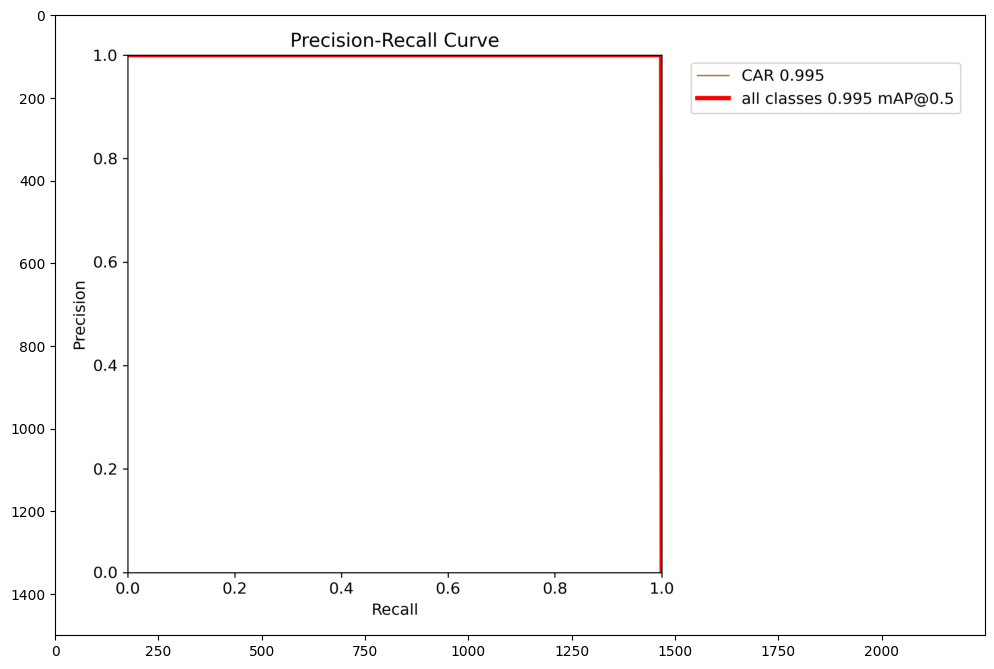

In [9]:
new_image = '/kaggle/working/runs/segment/train/BoxPR_curve.png'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Now you can see Mask F1-confidence curve  score 


image 1/1 /kaggle/working/runs/segment/train/MaskF1_curve.png: 448x640 (no detections), 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)


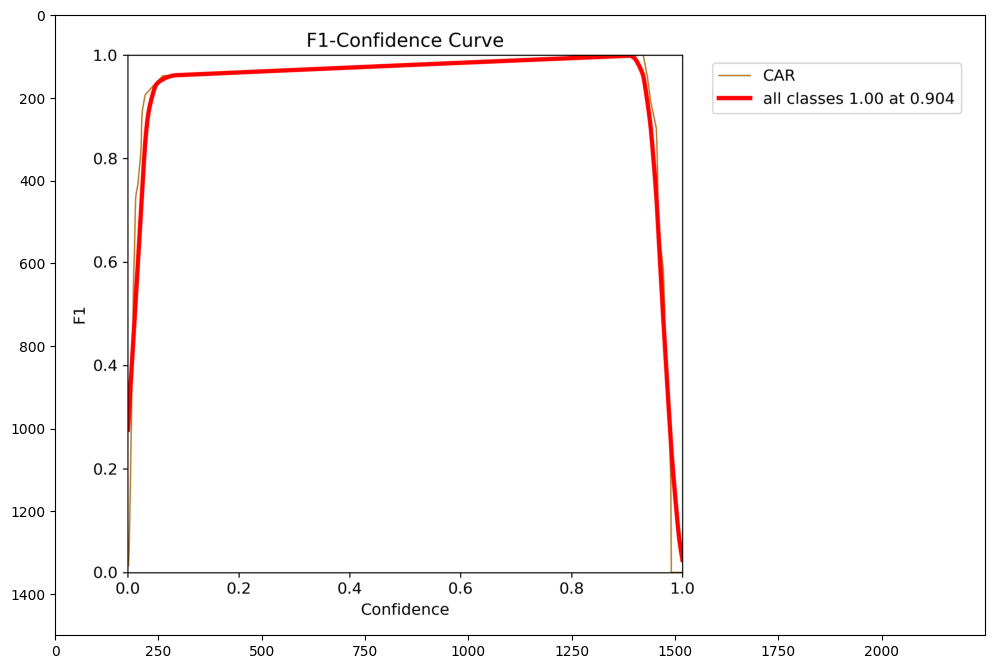

In [10]:
new_image = '/kaggle/working/runs/segment/train/MaskF1_curve.png'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Now you can see precsion confidence curve score graph


image 1/1 /kaggle/working/runs/segment/train/MaskP_curve.png: 448x640 (no detections), 14.1ms
Speed: 2.4ms preprocess, 14.1ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)


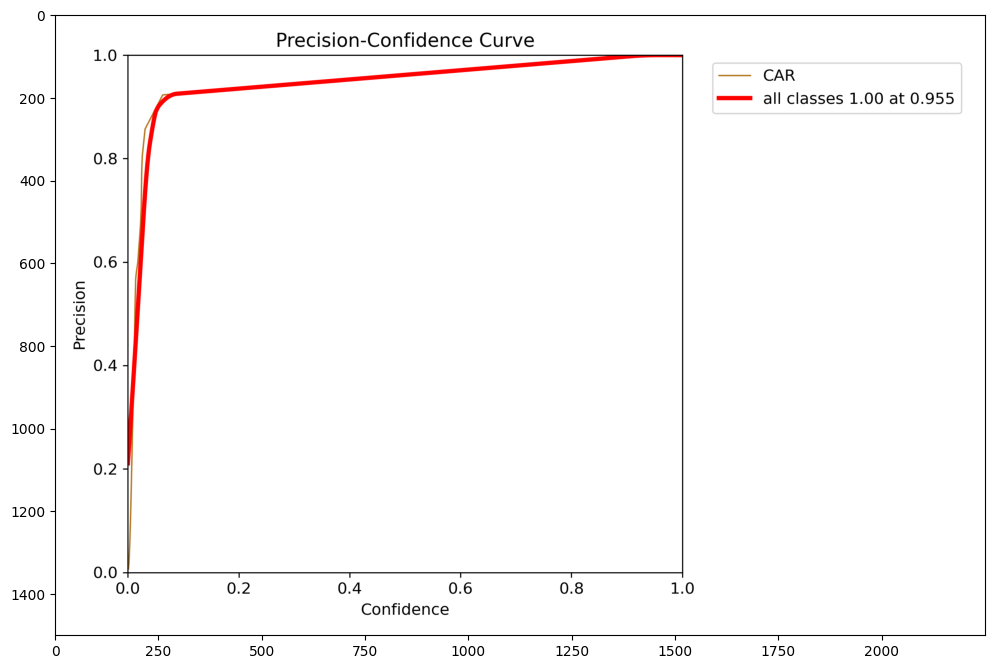

In [13]:
new_image = '/kaggle/working/runs/segment/train/MaskP_curve.png'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Now you can the confusion matrix without normalized  of custom model 


image 1/1 /kaggle/working/runs/segment/train/confusion_matrix.png: 480x640 (no detections), 92.4ms
Speed: 3.0ms preprocess, 92.4ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


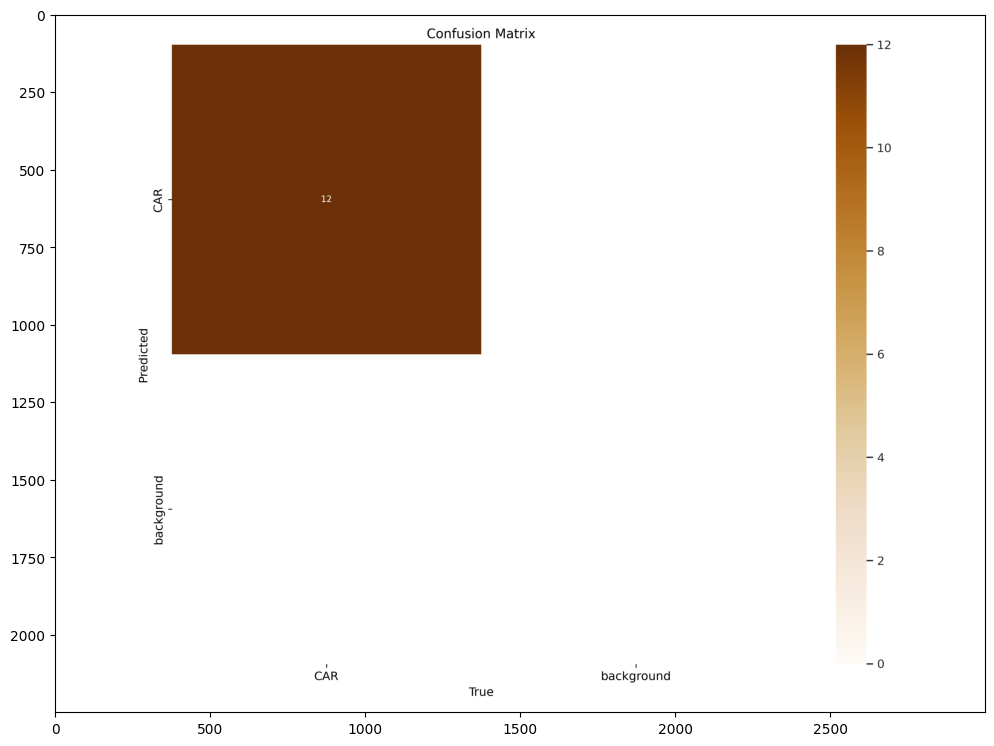

In [11]:
new_image = '/kaggle/working/runs/segment/train/confusion_matrix.png'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Now you can see the graph of labels_correlogram 


image 1/1 /kaggle/working/runs/segment/train/labels_correlogram.jpg: 640x640 (no detections), 17.6ms
Speed: 3.8ms preprocess, 17.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


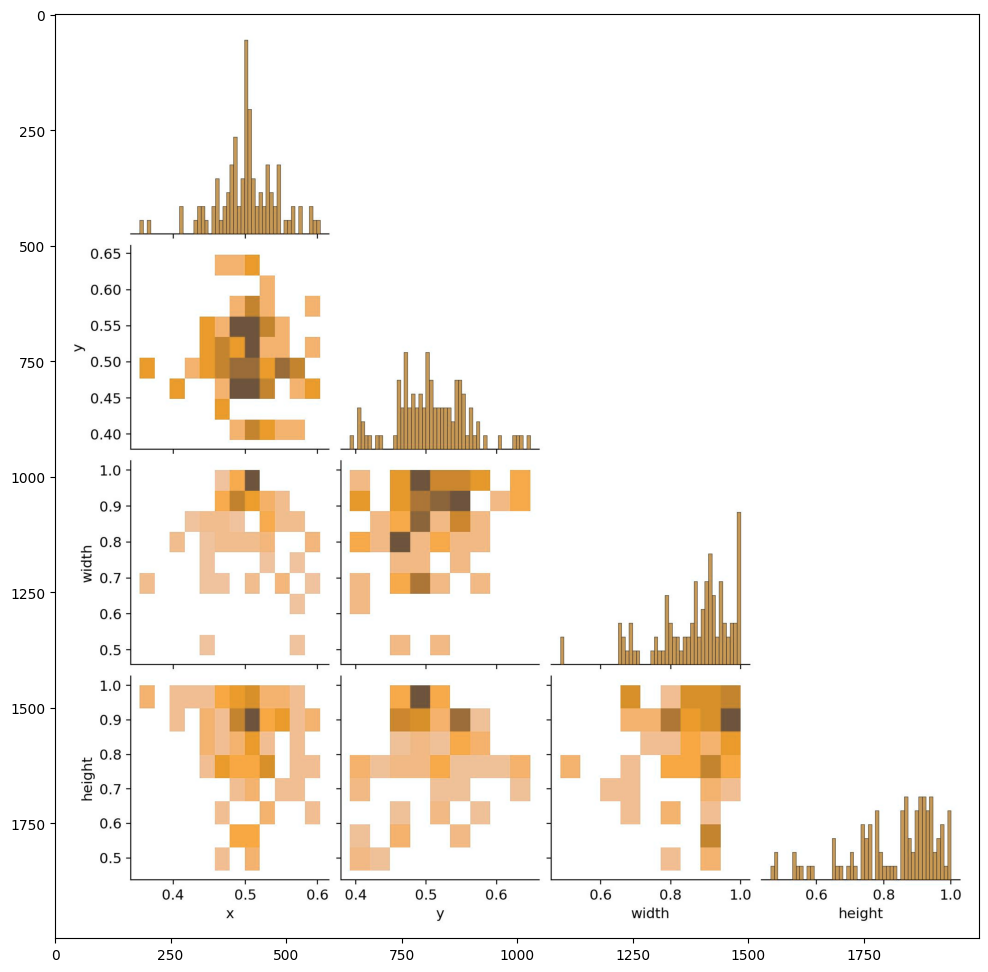

In [12]:
new_image = '/kaggle/working/runs/segment/train/labels_correlogram.jpg'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Here you can see the confusion matrix normalized graph


image 1/1 /kaggle/working/runs/segment/train/confusion_matrix_normalized.png: 480x640 (no detections), 14.5ms
Speed: 2.9ms preprocess, 14.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


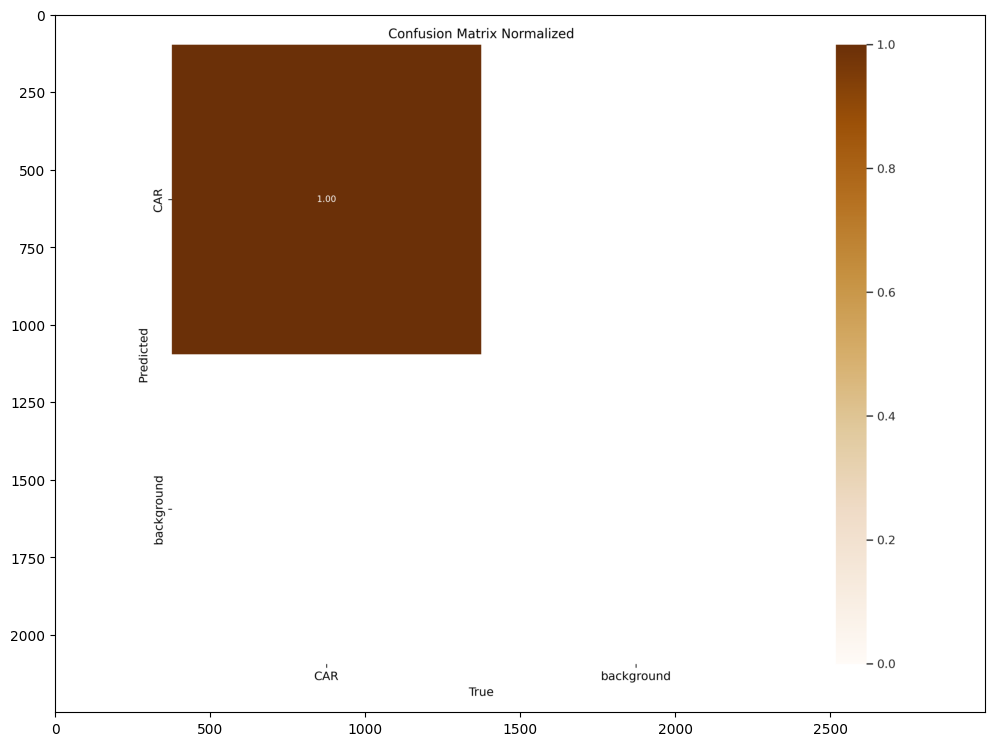

In [14]:
new_image = '/kaggle/working/runs/segment/train/confusion_matrix_normalized.png'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Now here you can see the how much our model train on training data


image 1/1 /kaggle/working/runs/segment/train/train_batch0.jpg: 640x640 6 CARs, 16.8ms
Speed: 3.2ms preprocess, 16.8ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)


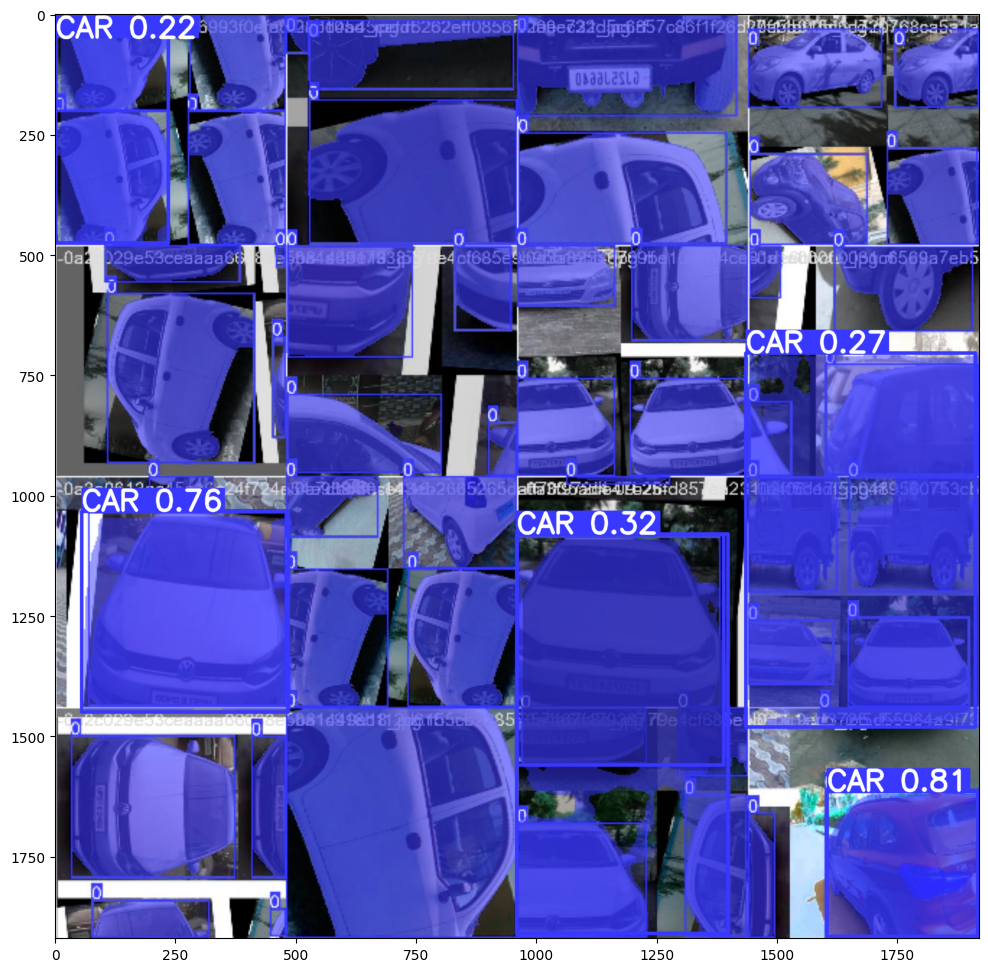

In [16]:
new_image = '/kaggle/working/runs/segment/train/train_batch0.jpg'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Now here i am loading the my custom yolo model 

In [125]:
# this is  my custom model 
model=YOLO("/kaggle/input/custom-car-model/best (10).pt")



# Let's see the prediction of car image
Using Actual data


image 1/1 /kaggle/input/test-data-problem-1/Actual Data/1.jpg: 384x640 1 CAR, 112.2ms
Speed: 2.9ms preprocess, 112.2ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)


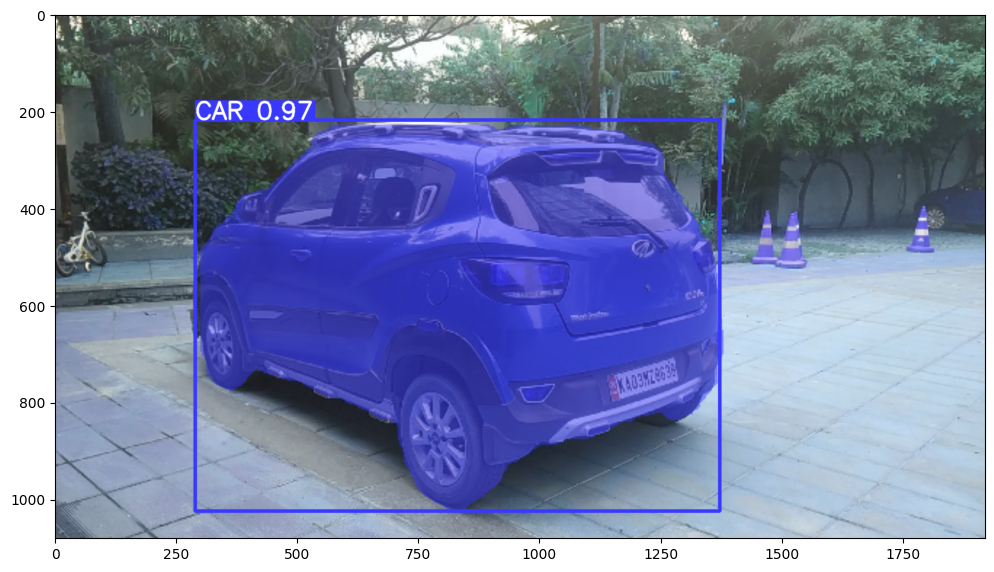

In [7]:

model=YOLO("/kaggle/input/custom-car-model/best (10).pt")
import matplotlib.pyplot as plt
new_image = '/kaggle/input/test-data-problem-1/Actual Data/1.jpg'
new_results = model.predict(new_image, conf=0.2) 
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

# Here i am checking the result variable how many value it have

In [131]:
new_results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'CAR'}
 obb: None
 orig_img: array([[[ 65,  65,  71],
         [ 57,  58,  62],
         [ 57,  59,  60],
         ...,
         [ 86,  96,  90],
         [ 73,  83,  77],
         [ 80,  90,  84]],
 
        [[ 68,  69,  73],
         [ 63,  64,  68],
         [ 61,  63,  64],
         ...,
         [ 90, 100,  94],
         [ 98, 108, 102],
         [111, 121, 115]],
 
        [[ 61,  63,  64],
         [ 59,  61,  62],
         [ 58,  60,  60],
         ...,
         [103, 115, 109],
         [117, 129, 123],
         [128, 138, 132]],
 
        ...,
 
        [[100, 106, 113],
         [ 99, 105, 112],
         [ 98, 104, 111],
         ...,
         [182, 195, 209],
         [188, 201, 215],
         [189, 202, 216]],
 
        [[102, 106, 111],
         [103, 107, 112],
         [103, 107, 112],


In [128]:
results = new_results[0]
mask= results.masks
boxes=results.boxes
class_names = results.names

class_name = class_names[0]# Extracting the name for class 0 (assuming 'CAR' corresponds to class 0)
print("Class Name:", class_name)
file_path = results.path
# Split the file path using '/' as the separator and get the last element
image_id = file_path.split('/')[-1].split('.')[0]

print("Image ID:", image_id)
print(mask)
print(boxes)

Class Name: CAR
Image ID: 1
ultralytics.engine.results.Masks object with attributes:

data: tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], device='cuda:0')
orig_shape: (1080, 1920)
shape: torch.Size([1, 384, 640])
xy: [array([[        576,         228],
       [        573,         231],
       [        567,         231],
       [        558,         240],
       [        549,         240],
       [        546,         243],
       [        543,         243],
       [        531,         255],
       [        531,         258],
       [        528,         261],
       [        528,         270],
       [        498,         300],
       [        495,         300],
       [        492,         303],
       [        492,         306],
       [        486,         312],
      

so you can see the result variable store the value like 
1. boundry boxes details 
2. mask (segmentation) details
3. image_id
4. class name
5. shape of the image 

As  you mention in the question the output shoude be coco json format  so now i am extracting the all information from the result variable and put into coco json format

# Below code help to convert mask value into coco json format

In [133]:
import cv2
import numpy as np

# Assuming 'mask' is the mask tensor from results.masks
mask_data = mask.data.cpu().numpy()
binary_mask = (mask_data > 0).astype(np.uint8)

# Find contours in the binary mask
contours, _ = cv2.findContours(binary_mask[0], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


# Convert contours to segmentation format
segmentation = []
for contour in contours:
    contour = np.squeeze(contour, axis=1).tolist()
    segmentation.append(contour)

# Now 'segmentation' contains the mask in COCO segmentation format
print(segmentation)


[[[192, 88], [191, 89], [189, 89], [186, 92], [183, 92], [182, 93], [181, 93], [177, 97], [177, 98], [176, 99], [176, 102], [166, 112], [165, 112], [164, 113], [164, 114], [162, 116], [161, 116], [160, 117], [160, 118], [158, 120], [157, 120], [156, 121], [156, 122], [154, 124], [153, 124], [152, 125], [152, 126], [150, 128], [149, 128], [148, 129], [148, 130], [146, 132], [144, 132], [143, 133], [139, 133], [138, 134], [136, 134], [135, 135], [132, 135], [131, 136], [129, 136], [128, 137], [128, 138], [126, 140], [125, 140], [125, 141], [124, 142], [124, 145], [123, 146], [123, 147], [122, 148], [122, 149], [119, 152], [118, 152], [114, 156], [113, 156], [108, 161], [108, 163], [107, 164], [107, 165], [104, 168], [104, 169], [100, 173], [100, 243], [101, 244], [101, 246], [103, 248], [103, 249], [104, 250], [104, 257], [105, 258], [105, 259], [108, 262], [108, 263], [111, 266], [112, 266], [113, 267], [114, 267], [115, 268], [116, 268], [117, 269], [119, 269], [120, 270], [122, 270], 

# So this is our final output coco json format for one image data

In [138]:
import json

# Example data
results = {
    'class_name': 'CAR',
    'boxes': [[1.6675, 34.6189, 640.0000, 638.3289]],  # Example bounding box coordinates [x_min, y_min, x_max, y_max]
    'image_id': '-0a0d4545cefd6262eff0856fc20ec721_jpg',  # Example image ID
    'segmentation': [[25, 78], [24, 79], [23, 79], [21, 81], [21, 83], [20, 84], [20, 90], [21, 91], [22, 91],
                     [23, 92], [24, 92], [26, 94], [30, 94], [31, 95], [34, 95], [36, 93], [36, 92], [38, 90],
                     [39, 90], [39, 88], [38, 87], [38, 86], [37, 85], [37, 84], [36, 83], [36, 81], [34, 79],
                     [31, 79], [30, 80], [29, 80], [28, 79], [27, 79], [26, 78], [289, 60], [288, 61], [285, 61], 
                     [284, 62], [271, 62], [270, 63], [267, 63], [266, 64], [256, 64], [255, 65], [252, 65], [251, 66], 
                     [250, 66], [249, 67], [244, 67], [243, 68], [241, 68], [240, 69], [240, 70], [239, 71], [238, 71], 
                     [232, 77], [232, 78], [230, 80], [229, 80], [229, 81], [226, 84], [225, 84], [224, 85], [224, 86], 
                     [222, 88], [221, 88], [219, 90], [219, 91], [213, 97], [213, 98], [208, 103], [208, 104], [207, 105], 
                     [207, 106], [206, 107], [205, 107], [204, 108], [203, 108], [202, 109], [199, 109], [198, 108], [197, 108], 
                     [196, 107], [195, 107], [191, 103], [190, 103], [185, 98], [184, 99], [177, 99], [176, 98], [174, 98], [173, 97],
                     [171, 97], [170, 96], [163, 96], [162, 95], [159, 95], [158, 94], [157, 94], [156, 93], [156, 92], [154, 90], 
                     [154, 86], [153, 85], [150, 85], [149, 84], [124, 84], [123, 85], [119, 85], [118, 86], [116, 86], [115, 87], 
                     [114, 87], [114, 88], [112, 90], [111, 90], [110, 91], [107, 91], [106, 92], [105, 92], [102, 95], [101, 95], 
                     [100, 96], [99, 96], [98, 97], [97, 97], [96, 98], [94, 98], [93, 99], [89, 99], [88, 100], [85, 100], [83, 102],
                     [82, 102], [81, 103], [80, 103], [79, 104], [76, 104], [75, 105], [74, 105], [72, 107], [71, 107], [70, 108], 
                     [68, 108], [67, 109], [66, 109], [65, 110], [64, 110], [63, 111], [61, 111], [60, 112], [32, 112], [31, 113], 
                     [26, 113], [25, 114], [10, 114], [9, 115], [9, 116], [8, 117], [8, 164], [9, 165], [9, 167], [11, 169], [12, 169],
                     [13, 170], [16, 170], [17, 171], [34, 171], [35, 172], [55, 172], [56, 173], [57, 173], [59, 175], [59, 178],
                     [57, 180], [57, 181], [56, 182], [56, 193], [55, 194], [55, 197], [54, 198], [54, 199], [53, 200], [53, 212],
                     [54, 213], [54, 214], [55, 215], [55, 216], [56, 217], [56, 224], [57, 225], [57, 226], [60, 229], [60, 231], 
                     [61, 232], [61, 233], [65, 237], [66, 237], [67, 238], [69, 238], [70, 239], [80, 239], [81, 240], [83, 240], 
                     [84, 241], [85, 241], [86, 242], [88, 242], [89, 243], [92, 243], [93, 244], [94, 244], [95, 245], [96, 245], 
                     [104, 253], [104, 254], [107, 257], [107, 258], [108, 259], [108, 260], [111, 263], [111, 264], [112, 265], 
                     [112, 266], [118, 272], [119, 272], [122, 275], [128, 275], [129, 276], [131, 276], [133, 278], [135, 278], 
                     [136, 279], [142, 279], [143, 280], [145, 280], [146, 281], [147, 281], [148, 282], [149, 282], [150, 283], 
                     [154, 283], [155, 284], [156, 284], [158, 286], [159, 286], [160, 287], [167, 287], [168, 286], [169, 286], 
                     [170, 285], [171, 285], [172, 284], [176, 284], [180, 288], [180, 289], [181, 290], [181, 291], [182, 292], 
                     [182, 293], [183, 294], [183, 295], [184, 296], [184, 297], [185, 298], [185, 299], [188, 302], [188, 303], 
                     [189, 304], [189, 305], [194, 310], [195, 310], [196, 311], [197, 311], [198, 312], [199, 312], [200, 313],
                     [201, 313], [202, 314], [203, 314], [204, 315], [208, 315], [209, 316], [217, 316], [218, 315], [225, 315], 
                     [226, 314], [227, 314], [228, 313], [229, 313], [230, 312], [231, 312], [232, 311], [237, 311], [238, 310], 
                     [239, 310], [241, 308], [242, 308], [243, 307], [246, 307], [249, 304], [250, 304], [251, 303], [252, 303], 
                     [253, 302], [254, 302], [254, 301], [257, 298], [257, 297], [260, 294], [260, 293], [261, 292], [261, 291], 
                     [262, 290], [262, 288], [263, 287], [263, 285], [264, 284], [264, 283], [266, 281], [266, 280], [267, 279], 
                     [267, 277], [270, 274], [270, 273], [271, 272], [271, 271], [272, 270], [272, 268], [273, 267], [277, 267], 
                     [280, 270], [282, 270], [283, 271], [289, 271], [291, 269], [291, 266], [292, 265], [292, 256], [293, 255],
                     [293, 254], [296, 251], [301, 251], [303, 253], [304, 253], [305, 254], [306, 254], [307, 255], [318, 255], 
                     [319, 254], [320, 254], [321, 253], [322, 253], [323, 252], [324, 252], [325, 251], [328, 251], [329, 250], 
                     [333, 250], [334, 249], [335, 249], [336, 248], [337, 248], [338, 247], [344, 247], [345, 246], [350, 246], 
                     [351, 245], [352, 245], [353, 244], [355, 244], [356, 243], [363, 243], [364, 242], [367, 242], [368, 241], 
                     [369, 241], [370, 240], [371, 240], [372, 239], [379, 239], [380, 238], [385, 238], [386, 237], [387, 237], 
                     [388, 236], [392, 236], [393, 235], [406, 235], [407, 236], [408, 236], [412, 240], [412, 241], [413, 242],
                     [414, 242], [416, 244], [417, 244], [419, 246], [420, 246], [421, 247], [442, 247], [443, 246], [444, 246], 
                     [445, 245], [446, 245], [447, 244], [448, 244], [449, 243], [450, 243], [459, 234], [459, 232], [460, 231], 
                     [460, 230], [463, 227], [463, 225], [466, 222], [466, 221], [467, 220], [467, 215], [468, 214], [468, 210], 
                     [469, 209], [469, 205], [470, 204], [470, 202], [471, 201], [471, 200], [476, 195], [477, 195], [478, 194],
                     [478, 193], [479, 192], [479, 81], [478, 80], [478, 77], [476, 75], [476, 74], [475, 73], [475, 72], [471, 68],
                     [470, 68], [469, 67], [468, 68], [460, 68], [459, 67], [452, 67], [451, 66], [449, 66], [448, 65], [446, 65], 
                     [445, 64], [442, 64], [441, 63], [435, 63], [434, 62], [431, 62], [430, 61], [424, 61], [423, 60], [365, 60], 
                     [364, 61], [359, 61], [358, 62], [355, 62], [354, 61], [338, 61], [337, 60]]
             }
# COCO JSON format
coco_format = {
    "images": [{"id": results['image_id']}],
    "annotations": [],
    "categories": [{"id": 0, "name": results['class_name']}]
}

# Assuming we have one bounding box for simplicity
for i, (box, segmentation) in enumerate(zip(results['boxes'], results['segmentation'])):
    annotation = {
        "id": i,
        "image_id": results['image_id'],
        "category_id": 0,  # Assuming CAR corresponds to category ID 0
        "bbox": box,  # [x_min, y_min, width, height]
        "area": (box[2] - box[0]) * (box[3] - box[1]),  # Calculating area
        "segmentation": segmentation,  # Adding segmentation
        "iscrowd": 0  # Assuming not a crowd annotation
    }
    coco_format["annotations"].append(annotation)

# Convert to JSON
coco_json = json.dumps(coco_format)
print(coco_json)


{"images": [{"id": "-0a0d4545cefd6262eff0856fc20ec721_jpg"}], "annotations": [{"id": 0, "image_id": "-0a0d4545cefd6262eff0856fc20ec721_jpg", "category_id": 0, "bbox": [1.6675, 34.6189, 640.0, 638.3289], "area": 385367.713575, "segmentation": [25, 78], "iscrowd": 0}], "categories": [{"id": 0, "name": "CAR"}]}


In [2]:
import json

# Example data
results = {
    'class_name': 'CAR',
    'boxes': [[1.6675, 34.6189, 640.0000, 638.3289]],  # Example bounding box coordinates [x_min, y_min, x_max, y_max]
    'image_id': '-0a0d4545cefd6262eff0856fc20ec721_jpg',  # Example image ID
}

# COCO JSON format
coco_format = {
    "images": [{"id": results['image_id']}],
    "annotations": [],
    "categories": [{"id": 0, "name": results['class_name']}]
    
}

# Assuming we have one bounding box for simplicity
for i, box in enumerate(results['boxes']):
    annotation = {
        "id": i,
        "image_id": results['image_id'],
        "category_id": 0,  # Assuming CAR corresponds to category ID 0
        "bbox": box,  # [x_min, y_min, width, height]
        "area": (box[2] - box[0]) * (box[3] - box[1]),  # Calculating area
        "iscrowd": 0  # Assuming not a crowd annotation
    }
    coco_format["annotations"].append(annotation)

# Convert to JSON
coco_json = json.dumps(coco_format)
print(coco_json)

{"images": [{"id": "-0a0d4545cefd6262eff0856fc20ec721_jpg"}], "annotations": [{"id": 0, "image_id": "-0a0d4545cefd6262eff0856fc20ec721_jpg", "category_id": 0, "bbox": [1.6675, 34.6189, 640.0, 638.3289], "area": 385367.713575, "iscrowd": 0}], "categories": [{"id": 0, "name": "CAR"}]}


#  Now i am trying to  collect information of all actal data into json Format


image 1/1 /kaggle/input/test-data-problem-1/Actual Data/5.jpg: 384x640 1 CAR, 14.4ms
Speed: 2.9ms preprocess, 14.4ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)


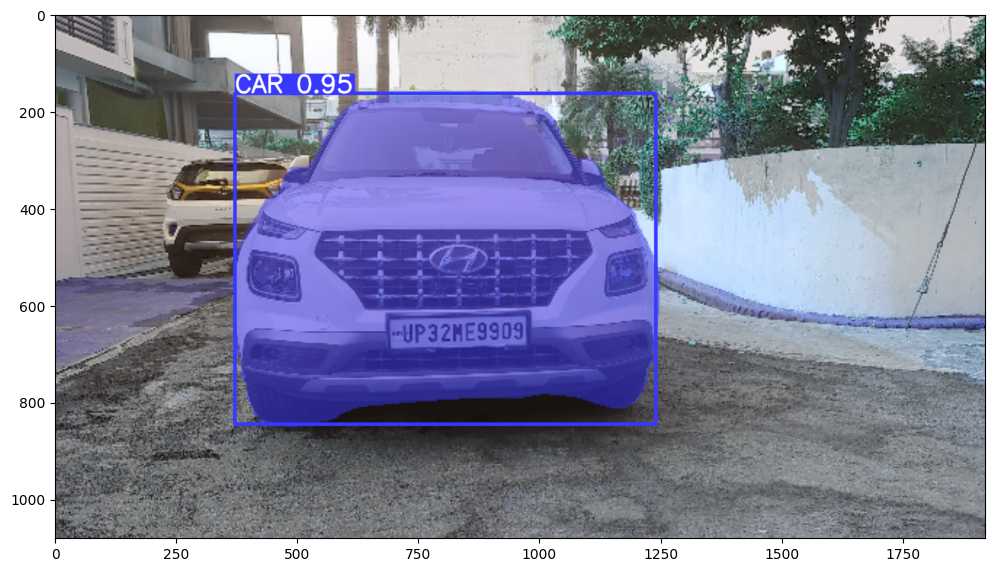


image 1/1 /kaggle/input/test-data-problem-1/Actual Data/1.jpg: 384x640 1 CAR, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)


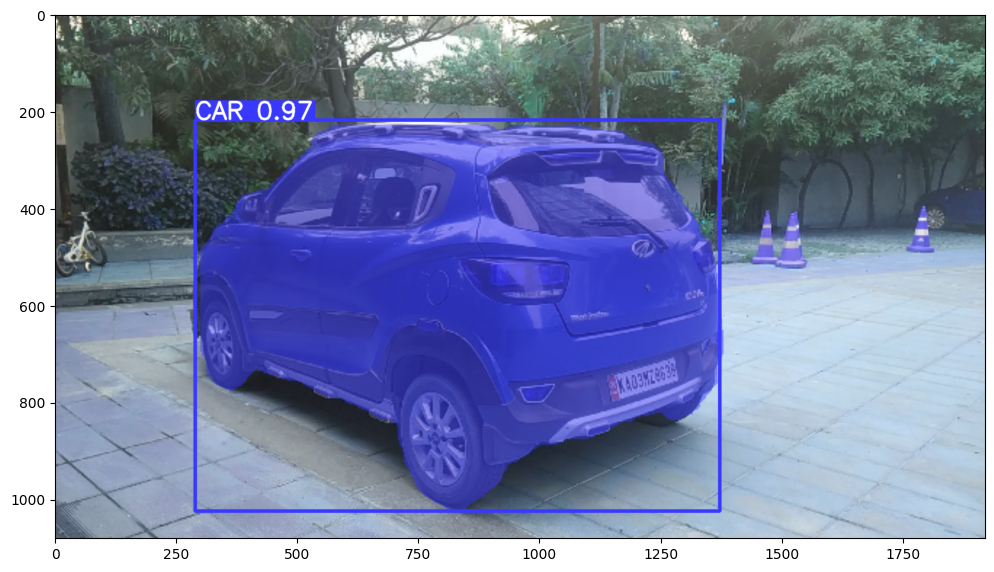


image 1/1 /kaggle/input/test-data-problem-1/Actual Data/4.jpg: 384x640 1 CAR, 12.0ms
Speed: 2.1ms preprocess, 12.0ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)


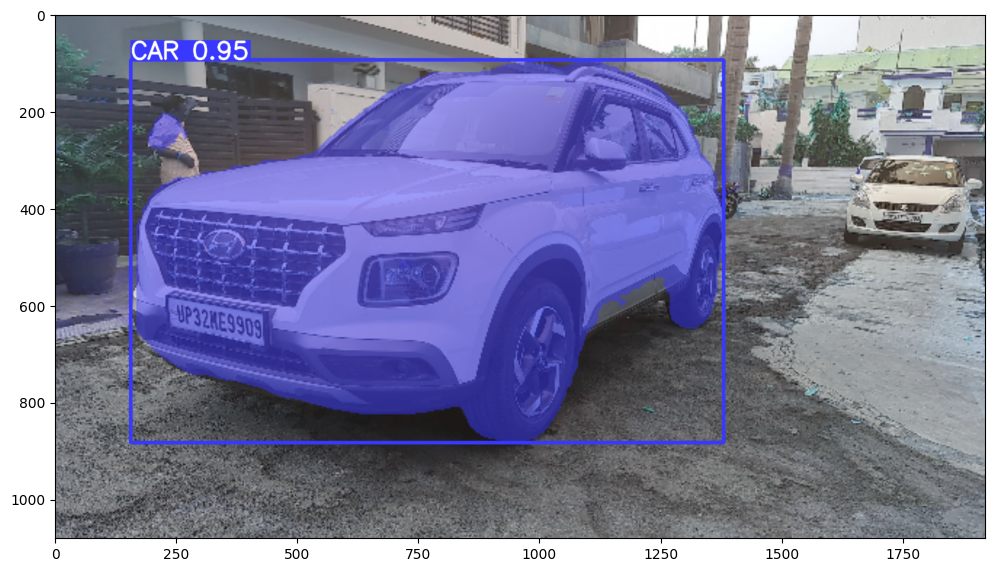


image 1/1 /kaggle/input/test-data-problem-1/Actual Data/3.jpg: 384x640 1 CAR, 12.2ms
Speed: 2.1ms preprocess, 12.2ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)


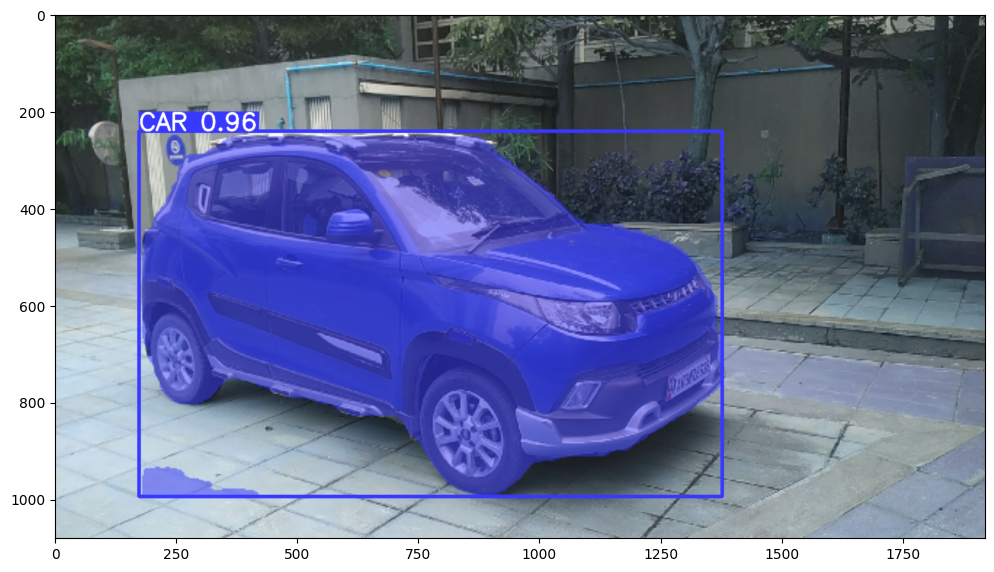


image 1/1 /kaggle/input/test-data-problem-1/Actual Data/2.jpg: 384x640 1 CAR, 12.1ms
Speed: 2.1ms preprocess, 12.1ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)


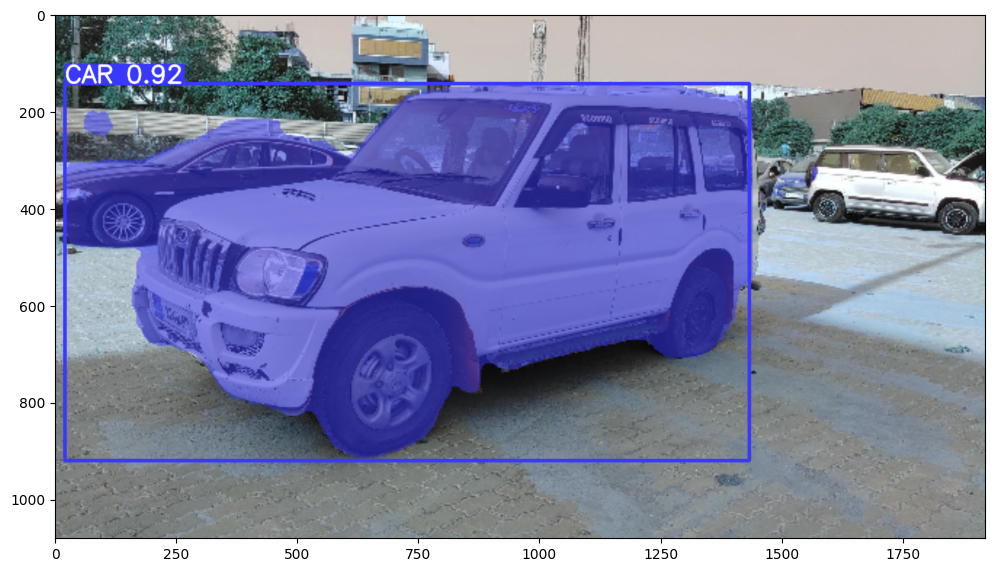

In [140]:
import os
import matplotlib.pyplot as plt
from glob import glob

# Path to the directory containing images
image_dir = '/kaggle/input/test-data-problem-1/Actual Data/'

# Get a list of all image files in the directory
image_files = glob(os.path.join(image_dir, '*.jpg'))

# Iterate over each image file
for image_file in image_files:
    # Predict using the YOLO model
    new_results = model.predict(image_file, conf=0.2)
    new_result_array = new_results[0].plot()

    # Display the image with predictions
    plt.figure(figsize=(12, 12))
    plt.imshow(new_result_array)
    plt.show()


In [142]:
import os
import matplotlib.pyplot as plt
from glob import glob

# Path to the directory containing images
image_dir = '/kaggle/input/test-data-problem-1/Actual Data/'

# Get a list of all image files in the directory
image_files = glob(os.path.join(image_dir, '*.jpg'))

# Iterate over each image file
for image_file in image_files:
    # Predict using the YOLO model
    new_results = model.predict(image_file, conf=0.2)
    new_result_array = new_results[0]
    result=new_result_array.boxes
    result_1=new_result_array.masks
    file_path = new_result_array.path
# Split the file path using '/' as the separator and get the last element
    image_id = file_path.split('/')[-1].split('.')[0]

    print("Image ID:", image_id)
    print(result_1)
    print(result)


image 1/1 /kaggle/input/test-data-problem-1/Actual Data/5.jpg: 384x640 1 CAR, 12.0ms
Speed: 2.2ms preprocess, 12.0ms inference, 3.1ms postprocess per image at shape (1, 3, 384, 640)
Image ID: 5
ultralytics.engine.results.Masks object with attributes:

data: tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], device='cuda:0')
orig_shape: (1080, 1920)
shape: torch.Size([1, 384, 640])
xy: [array([[        687,         168],
       [        684,         171],
       [        669,         171],
       [        666,         174],
       [        657,         174],
       [        654,         177],
       [        627,         177],
       [        624,         180],
       [        618,         180],
       [        615,         183],
       [        612,         183],
       [      

In [108]:
new_results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'CAR'}
 obb: None
 orig_img: array([[[100, 123, 125],
         [ 14,  37,  39],
         [ 46,  72,  72],
         ...,
         [201, 191, 184],
         [201, 191, 184],
         [201, 191, 184]],
 
        [[  9,  32,  34],
         [  9,  32,  34],
         [ 21,  47,  47],
         ...,
         [201, 191, 184],
         [201, 191, 184],
         [201, 191, 184]],
 
        [[ 75, 101, 101],
         [ 52,  78,  78],
         [  8,  37,  34],
         ...,
         [201, 191, 184],
         [201, 191, 184],
         [201, 191, 184]],
 
        ...,
 
        [[107, 113, 108],
         [ 99, 105, 100],
         [122, 128, 123],
         ...,
         [136, 141, 144],
         [134, 139, 142],
         [131, 136, 139]],
 
        [[144, 150, 145],
         [134, 140, 135],
         [139, 145, 140],


In [109]:
# Assuming 'new_results' is a list containing one 'ultralytics.engine.results.Results' object
results = new_results[0]

mask= results.masks
boxes=results.boxes
print(mask)
print(boxes)


ultralytics.engine.results.Masks object with attributes:

data: tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], device='cuda:0')
orig_shape: (1080, 1920)
shape: torch.Size([1, 384, 640])
xy: [array([[        867,         144],
       [        864,         147],
       [        855,         147],
       [        852,         150],
       [        813,         150],
       [        810,         153],
       [        801,         153],
       [        798,         156],
       [        768,         156],
       [        765,         159],
       [        756,         159],
       [        753,         162],
       [        750,         162],
       [        747,         165],
       [        732,         165],
       [        729,         168],
       [        723,         168],

# Second Approach 

in this second approach i am using detectron2 image segmentation pretrain model 

In [1]:

!python -m pip install pyyaml

In [2]:
import sys, os, distutils.core

# Here i am loading the pre-train detectron2 model from the github

In [3]:
!git clone 'https://github.com/facebookresearch/detectron2'

Cloning into 'detectron2'...
remote: Enumerating objects: 15676, done.
remote: Counting objects: 100% (399/399), done.
remote: Compressing objects: 100% (305/305), done.
remote: Total 15676 (delta 176), reused 285 (delta 94), pack-reused 15277
Receiving objects: 100% (15676/15676), 6.51 MiB | 28.84 MiB/s, done.
Resolving deltas: 100% (11292/11292), done.


In [4]:
dist = distutils.core.run_setup("./detectron2/setup.py")

In [5]:
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 57.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.5/53.5 kB 3.7 MB/s eta 0:00:00
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61400 sha256=52cb49324ef851a9392cc6268c0a4eb99663beac8ef6ce5d43fc3867c9c538a0
  Stored in directory: /root/.cache

In [6]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Mon_Apr__3_17:16:06_PDT_2023
Cuda compilation tools, release 12.1, V12.1.105
Build cuda_12.1.r12.1/compiler.32688072_0
torch:  2.1 ; cuda:  2.1.2
detectron2: 0.6


In [7]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
# from google.colab.patches import cv2_imshow
setup_logger()

<_Logger detectron2 (DEBUG)>

In [8]:
# import some common libraries
import numpy as np
import os, json, cv2, random
# from google.colab.patches import cv2_imshow

In [9]:
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
import matplotlib.pyplot as plt

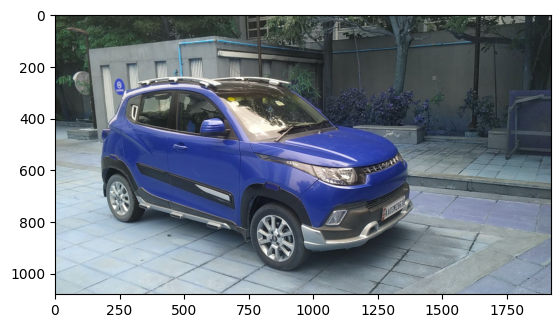

In [41]:
im = cv2.imread("/kaggle/input/test-data-problem-1/Actual Data/3.jpg")
plt.imshow(im)

In [42]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo.  https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

[05/14 19:50:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


In [44]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([58,  2, 58,  2], device='cuda:0')
Boxes(tensor([[1553.7239,  284.1018, 1731.2296,  482.0172],
        [ 154.5935,  244.6506, 1393.8151,  981.9118],
        [1036.6367,  258.7781, 1439.4634,  497.7926],
        [ 606.8781,  240.7019,  910.9943,  278.8318]], device='cuda:0'))


<function matplotlib.pyplot.show(close=None, block=None)>

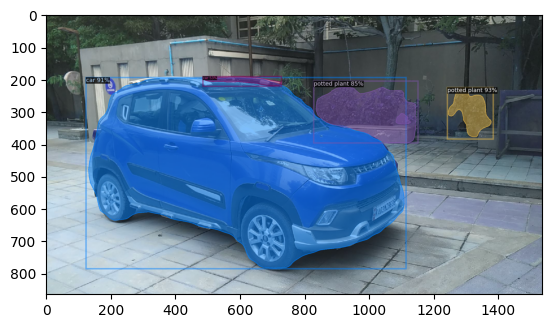

In [45]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.imshow(out.get_image()[:, :, ::-1])
plt.show

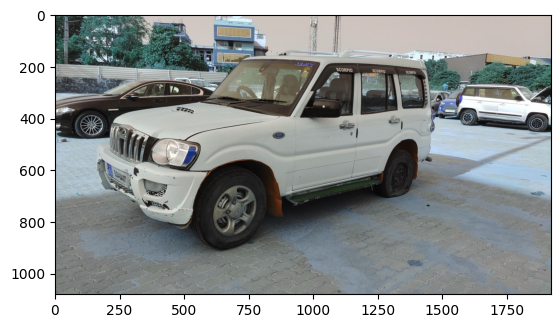

In [48]:
sci_im = cv2.imread("/kaggle/input/test-data-problem-1/Actual Data/2.jpg")
plt.imshow(sci_im)
plt.show()

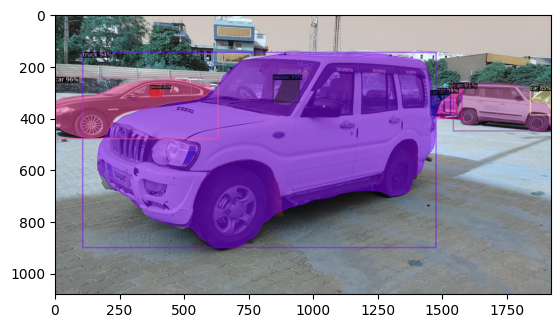

In [47]:
sci_outputs = predictor(sci_im)
sci_v = Visualizer(sci_im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
sci_out = sci_v.draw_instance_predictions(sci_outputs["instances"].to("cpu"))
plt.imshow(sci_out.get_image()[:, :, ::-1])

In [16]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train1", {}, "/kaggle/input/detectron2-dataset/car_detect_seg.v1i.coco-segmentation/train/_annotations.coco.json", "/kaggle/input/detectron2-dataset/car_detect_seg.v1i.coco-segmentation/train")
register_coco_instances("my_dataset_val1", {}, "/kaggle/input/detectron2-dataset/car_detect_seg.v1i.coco-segmentation/valid/_annotations.coco.json", "/kaggle/input/detectron2-dataset/car_detect_seg.v1i.coco-segmentation/valid")



In [17]:

train_metadata = MetadataCatalog.get("my_dataset_train1")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train1")

WARNING [05/14 19:22:41 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/14 19:22:41 d2.data.datasets.coco]: Loaded 40 images in COCO format from /kaggle/input/detectron2-dataset/car_detect_seg.v1i.coco-segmentation/train/_annotations.coco.json


In [18]:
from matplotlib import pyplot as plt

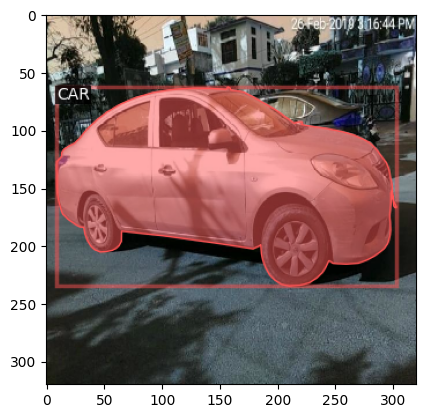

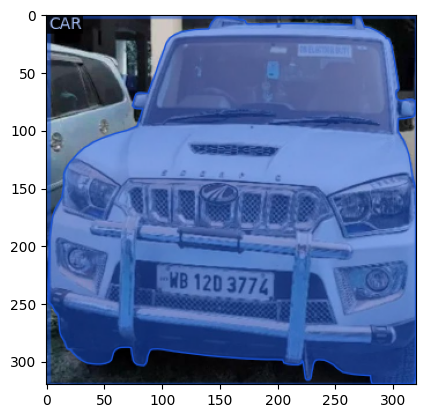

In [19]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

# Model Training

In [20]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train1",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 1000 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # We have 4 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available

     

[05/14 19:22:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [21]:
trainer.train() #Start the training process

[05/14 19:22:43 d2.engine.train_loop]: Starting training from iteration 0
[05/14 19:22:51 d2.utils.events]:  eta: 0:05:12  iter: 19  total_loss: 2.339  loss_cls: 1.454  loss_box_reg: 0.1936  loss_mask: 0.6802  loss_rpn_cls: 0.008793  loss_rpn_loc: 0.004399    time: 0.3187  last_time: 0.3185  data_time: 0.0107  last_data_time: 0.0046   lr: 4.9953e-06  max_mem: 1971M


2024-05-14 19:22:53.887071: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-14 19:22:53.887185: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-14 19:22:54.041436: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[05/14 19:23:09 d2.utils.events]:  eta: 0:05:07  iter: 39  total_loss: 2.192  loss_cls: 1.334  loss_box_reg: 0.1975  loss_mask: 0.6381  loss_rpn_cls: 0.009746  loss_rpn_loc: 0.005886    time: 0.3245  last_time: 0.3509  data_time: 0.0048  last_data_time: 0.0047   lr: 9.9902e-06  max_mem: 1971M
[05/14 19:23:15 d2.utils.events]:  eta: 0:04:59  iter: 59  total_loss: 1.848  loss_cls: 1.081  loss_box_reg: 0.1805  loss_mask: 0.5713  loss_rpn_cls: 0.00535  loss_rpn_loc: 0.005389    time: 0.3208  last_time: 0.2996  data_time: 0.0049  last_data_time: 0.0049   lr: 1.4985e-05  max_mem: 1971M
[05/14 19:23:21 d2.utils.events]:  eta: 0:04:54  iter: 79  total_loss: 1.458  loss_cls: 0.7767  loss_box_reg: 0.1991  loss_mask: 0.4811  loss_rpn_cls: 0.009489  loss_rpn_loc: 0.005677    time: 0.3223  last_time: 0.2861  data_time: 0.0048  last_data_time: 0.0046   lr: 1.998e-05  max_mem: 1971M
[05/14 19:23:28 d2.utils.events]:  eta: 0:04:48  iter: 99  total_loss: 1.096  loss_cls: 0.4788  loss_box_reg: 0.1874  l

In [25]:

# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 168), started 0:08:45 ago. (Use '!kill 168' to kill it.)

In [27]:
import yaml

config_yaml_path = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/config.yaml"

with open(config_yaml_path, 'w') as file:
    
    yaml.dump(cfg, file)

In [28]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)
     

[05/14 19:43:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/model_final.pth ...


In [29]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

NameError: name 'val_dataset_dicts' is not defined

In [31]:


from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val1", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val1")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/14 19:44:17 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [05/14 19:44:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/14 19:44:17 d2.data.datasets.coco]: Loaded 10 images in COCO format from /kaggle/input/detectron2-dataset/car_detect_seg.v1i.coco-segmentation/valid/_annotations.coco.json
[05/14 19:44:17 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|  CAR-bcze  | 0            |    CAR     | 10           |
|            |              |            |              |
|   total    | 10           |            |              |
[05/14 19:44:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/14 19:44:17 d2.dat

# Testing with  actual data 

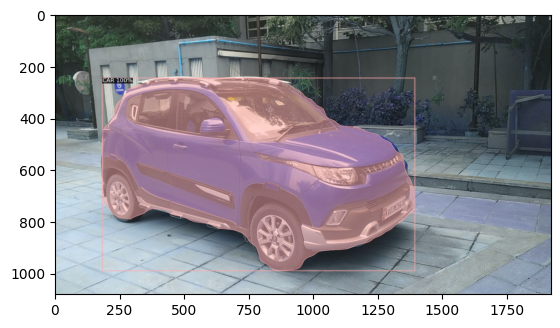

In [33]:
new_im = cv2.imread("/kaggle/input/test-data-problem-1/Actual Data/3.jpg")
outputs  = predictor(new_im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

plt.imshow(out.get_image()[:, :, ::-1])

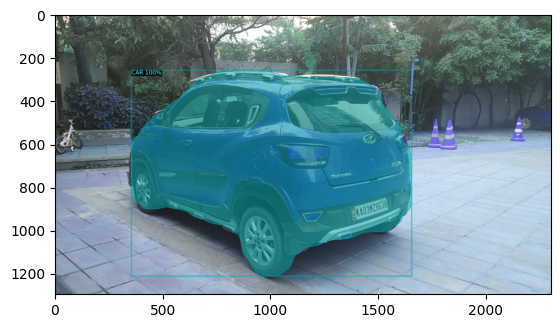

In [40]:
import cv2
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

new_im = cv2.imread("/kaggle/input/test-data-problem-1/Actual Data/1.jpg")
outputs = predictor(new_im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(new_im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

plt.imshow(out.get_image()[:, :, ::-1])

# Here you can see json format of Actual data using detectron2

In [39]:
import numpy as np
from detectron2.structures import BoxMode
import json

new_im = cv2.imread("/kaggle/input/test-data-problem-1/Actual Data/3.jpg")
outputs = predictor(new_im)

# Convert predictions to COCO JSON format
coco_predictions = []
for i in range(len(outputs["instances"])):
    instance = outputs["instances"][i]
    prediction = {
        "image_id": 0,  # Assuming a single image
        "category_id": instance.pred_classes[0].item(),  # Assuming single category per prediction
        "bbox": instance.pred_boxes.tensor[i].tolist(),  # Assuming single bbox per prediction
        "score": instance.scores[0].item(),  # Assuming single score per prediction
        "segmentation": instance.pred_masks[i].to("cpu").numpy().tolist(),  # Convert mask to numpy array and then to list
    }
    coco_predictions.append(prediction)

# Write predictions to a JSON file
with open("predictions1.json", "w") as f:
    json.dump(coco_predictions, f)
